In [1]:
import example_utils as utils
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import networkx as nx

In [2]:
import geoplot as gplt
import geoplot.crs as gcrs
import geopandas as gpd

In [3]:
from shapely.ops import unary_union
import shapely.speedups
from shapely.geometry import Polygon, LineString, Point

# Load model stuff

In [4]:
def AddTransparency(c,a):
    b = format(max(int(255*a),0),'02X')
    return c+str(b[-2:])

In [5]:
def convert_imperial_network_edges_to_oxford_network_edges(network_data):
    network_data.rename(columns = {'a.index': 'ID_1', 'b.index': 'ID_2'}, inplace=True)
    return network_data

def convert_imperial_node_data_to_oxford_node_data(person_node_data, index_to_label_network_with):
    person_node_data.rename(columns = {'index': 'ID',
                                       'household.index': 'house_no',
                                       'age': 'age_group',
                                       'coord.x': 'x',
                                       'coord.y': 'y'}, inplace=True)

    person_node_data['network_no'] = (np.zeros(len(person_node_data)) + index_to_label_network_with)

    # Convert the age to age group (the decade age group of the person and is an integer between 0 (0-9 years) and 8 (80+).)
    person_node_data['age_group'] = person_node_data['age_group'].apply(lambda x: int(x / 10))

    #print(person_node_data) # CA remove

    return person_node_data

In [6]:
def coord2ll(x,y):
    return np.array([y,x]) * 57.2957795131

def ll2coord(long,lat):
    return np.array([lat,long]) / 57.2957795131

def coord2ll_listIn(x):
    return coord2ll(x[1],x[0])

def ll2coord_list(x):
    return ll2coord(x[1],x[0])

In [7]:
##########################
# Load Network Functions #
##########################

# Take path of _nodes.csv
def LoadDemographics(demoPath):
    df_household_demographics = pd.read_csv(demoPath, comment="#", sep=",", skipinitialspace=True)
    # Converting we use network_no=0, as that's for household network
    df_household_demographics = convert_imperial_node_data_to_oxford_node_data(df_household_demographics,0)
    return df_household_demographics

def CoordsFromDemo(df_household_demographics):
    df_coordinates = df_household_demographics.rename(columns={'x':'xcoords','y':'ycoords'})[['ID','xcoords','ycoords']]
    return df_coordinates

def LoadOccupationNetworks(projPath,prefix='bristol'):
    ocNetworksArcs_df_dict = {}
    ocNetworksArcs_colNames = ['ID_1','a.x','a.y','ID_2','b.x','b.y']
    network_name = np.array(['primary', 'secondary', 'general_workforce', 'retired', 'elderly'])

    # Can find network assignment by the a.index for each _i_arcs.csv
    for i,x in enumerate(tqdm(network_name)):
        print([i,x])
        ocNetworksArcs_df_dict[x] = pd.read_csv(projPath+'/'+prefix+"_"+str(i)+"_arcs.csv", comment="#", sep=",", skipinitialspace=True)
        ocNetworksArcs_df_dict[x].columns = ocNetworksArcs_colNames
    
    return ocNetworksArcs_df_dict

###################
# Parameter stuff #
###################

def LoadParams(df_household_demographics,params=None):
    if params == None:
        params = utils.get_baseline_parameters()
    n_total = len(df_household_demographics["ID"])
    params.set_param("n_total",n_total)
    params.set_demographic_household_table(df_household_demographics)
    return params

def LoadNetworks(model,ocNetworksArcs_df_dict,daily_fration=0.5):
    for i,net in enumerate(ocNetworksArcs_df_dict):
        model.delete_network(model.get_network_by_id(i+2))
        model.add_user_network(ocNetworksArcs_df_dict[net],name=net,daily_fraction=daily_fration)

def ImperialNetwork(netPath,n_infect=10,prefix='bristol'):
    df_household_demographics = LoadDemographics(netPath+'/'+prefix+'_0_nodes.csv')
    df_coordinates = CoordsFromDemo(df_household_demographics)
    ocNetworksArcs_df_dict = LoadOccupationNetworks(netPath)
    params = LoadParams(df_household_demographics)
    params.set_param("n_seed_infection",n_infect)
    
    #params.set_param("relative_transmission_random",0)
    
    
    model = utils.get_simulation( params ).env.model
    model.assign_coordinates_individuals(df_coordinates)
    LoadNetworks(model,ocNetworksArcs_df_dict)
    return model

In [8]:
statuses2Track = [1,2,3,4,5,6,7,8,20] # In model.py, v. difficult to find
statuses2Track = [4,5]

def Infected(model):
    x = model.get_individuals()
    x = x.loc[x['current_status'].isin(statuses2Track)]
    return list(x['ID'])

In [9]:
# scarrily current_status does not seem to change when quarantined
def Lockdowned(model):
    x = model.get_individuals()
    x = x.loc[x['quarantined'] == 1]
    return list(x['ID'])

In [10]:
def VisualiseNetwork(model,ax,aNode = 1/2**7,aEdge = 1/2**7):
    nodes = model.get_individuals()
    nodes_pos = {nodes['ID'][i]:[nodes['xcoords'][i],nodes['ycoords'][i]] for i in range(len(nodes))}
    infected = Infected(model)
    quarantined = Lockdowned(model)
    g = nx.Graph()
    #g = nx.from_pandas_edgelist(ocNetworksArcs_df_dict['primary'],'ID_1','ID_2',create_using=nx.Graph())
    g.add_nodes_from(nodes['ID'])
    g_infected = nx.subgraph(g,infected)
    g_quarantined = nx.subgraph(g,quarantined)
    #f,ax = plt.subplots(figsize=(20,10))
    nx.draw(g,pos=nodes_pos,node_size=5,edge_color=AddTransparency(hadeanOrange,aEdge),node_color=AddTransparency(hadeanIndigo,aNode),ax=ax)
    nx.draw_networkx_nodes(g_quarantined,pos=nodes_pos,node_size=5,node_color=AddTransparency(uranianBlue,0.02),ax=ax)
    nx.draw_networkx_nodes(g_infected,pos=nodes_pos,node_size=5,node_color=AddTransparency(hadeanOrange,0.9),ax=ax)

# GIS plots

In [11]:
iow_path = '../../id_spatial_sim/scenarios/bristol/output/networks'
model_iow = ImperialNetwork(iow_path)

  0%|          | 0/5 [00:00<?, ?it/s]

[0, 'primary']
[1, 'secondary']
[2, 'general_workforce']
[3, 'retired']
[4, 'elderly']


In [12]:
# I'm using MSOAs because I was playing around with the IoW,
# but any shapefile will work (i.e. local authorities)
iow_msoa = pd.read_csv('../../id_spatial_sim/scenarios/bristol/msoaLists/bristol_msoa.csv')


In [14]:
msoaShapefilesPath = '../../id_spatial_sim/data/msoa_shapefile/Middle_Layer_Super_Output_Areas_(December_2011)_Boundaries.shp'
msoaShapefiles = gpd.read_file(msoaShapefilesPath)

In [15]:
polygons = [msoaShapefiles.loc[msoaShapefiles['msoa11cd']==x]['geometry'] for x in list(iow_msoa['msoa11cd'])]

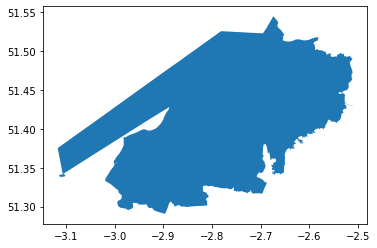

In [16]:
# Combine and plot the shapefiles for overlapping area
sf_iow = polygons[0]
for i in range(len(polygons)):
    sf_iow = sf_iow.union(polygons[i],align=False)
sf_iow = sf_iow.to_crs("WGS84") #d weird GIS projectoins
sf_iow.plot()

In [17]:
def IndividualSeries(model):
    return gpd.GeoSeries([Point(coord2ll_listIn(x)) for x in np.array(model.get_individuals()[['xcoords','ycoords']])])

In [18]:
# # Combine and plot the shapefiles for overlapping area
# sf_iow = polygons[0]
# for i in range(len(polygons)):
#     sf_iow = sf_iow.union(polygons[i],align=False)
# sf_iow = sf_iow.to_crs("WGS84") #d weird GIS projectoins
# sf_iow.plot()

# X = IndividualSeries(model_iow)
# projection=gcrs.WebMercator()
# ax = gplt.webmap(X,figsize=(100,100))
# gplt.pointplot(X,ax=ax,color='orange')

KeyboardInterrupt: 

In [19]:
# Infect and run
for i in range(10):
    model_iow.new_infection_by_idx(i,0,0,0)
for i in tqdm(range(16)):
    model_iow.one_time_step()
# model_iow.one_time_step_results()

  0%|          | 0/16 [00:00<?, ?it/s]

In [20]:
def InfectedSeries(model):
    I = Infected(model)
    X = [Point(coord2ll_listIn(x[1:])) for x in np.array(model.get_individuals()[['ID','xcoords','ycoords']]) if x[0] in I]
    return gpd.GeoSeries(X)

/home/linuxbrew/.linuxbrew/opt/python@3.9/lib/python3.9/site-packages/geoplot/geoplot.py:1724: UserWarning: "webmap" is only compatible with the "WebMercator" projection, but the input projection is unspecified. Reprojecting the data to "WebMercator" automatically. To suppress this warning, set "projection=gcrs.WebMercator()" explicitly.
  warnings.warn(
/home/linuxbrew/.linuxbrew/opt/python@3.9/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/linuxbrew/.linuxbrew/opt/python@3.9/lib/python3.9/site-packages/seaborn/distributions.py:1718: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)
/home/linuxbrew/.linuxbrew/opt/python@

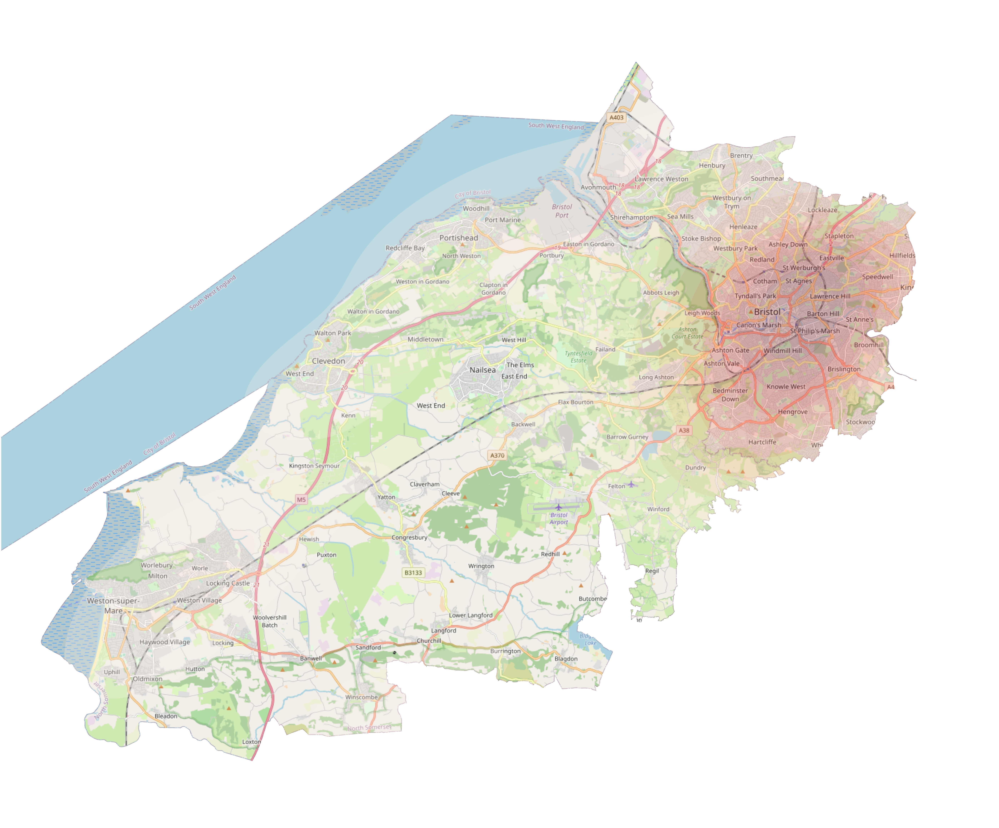

In [21]:
# Hip kinda heatmap of infected overlayed on actual map
#d Takes a while
X = IndividualSeries(model_iow)
ax = gplt.webmap(X,figsize=(100,100))
gplt.kdeplot(InfectedSeries(model_iow),shade=True, cmap='Reds',alpha=0.25,ax=ax)
gplt.kdeplot(X,shade=True,alpha=0.0,ax=ax,clip=sf_iow) #d a hacky way to not 'zoom' into to only the area infected are